In [399]:
#IPSC_analysis
##IPSC_analysis.ipynb

#Generated by Hassan Hosseini
# LIN
# Team Prigge
# 2021



In [400]:
#pip install -U kaleido

In [401]:
#pip install orca

In [1]:
# Next we want to install all packages and libraries we need for our analysis

from scipy.optimize import curve_fit
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from openpyxl import Workbook
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.metrics import r2_score
#from scipy.stats import norm
import seaborn as sns
from scipy import stats
from statannot import add_stat_annotation
import os.path
import chart_studio.plotly as py
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objects as go



In [40]:
#%% TAKE A LOOK AT THE DATA FIRST note: SHOULD BE BASELINED TO ZERO IN "STIMFIT"

Win_duration = 14 * 6 # analysis window for EPSC which is duration of the window times the sweep numbers
save_path = r'C:\Users\shossein\Desktop\New folder\2020\December\07.12.2020\Cell_1\IPSC'

path_before = save_path + '/0019_events_before.xlsx'
data_before = pd.read_excel(path_before, skiprows=11) #

path_after = save_path + '/0019_events_after.xlsx'
data_after = pd.read_excel(path_after, skiprows=11) #

path_Event_time_before = save_path + '/0019_events_time_before.xlsx'
Event_time_before = pd.read_excel(path_Event_time_before) #
path_Event_time_after = save_path + '/0019_events_time_after.xlsx'
Event_time_after = pd.read_excel(path_Event_time_after) #

In [5]:
#%% Defining the monoexponential function
 
# function for single exponential on kinetics NOTE :WHEN USING MULTIPLICATION REMEMBER TO DEVIDE THE TAU
def func_exp_1(x, a, b, c):
   return a * -np.exp(-x / b) + c

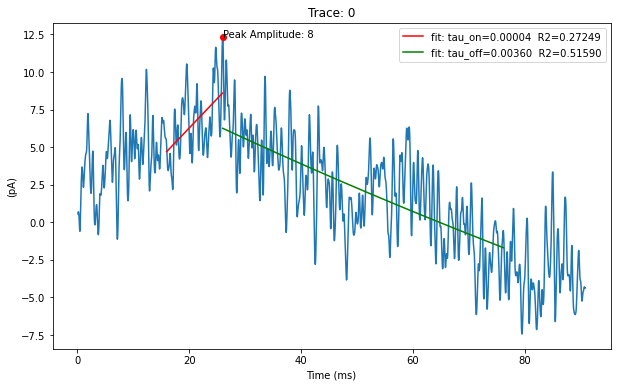

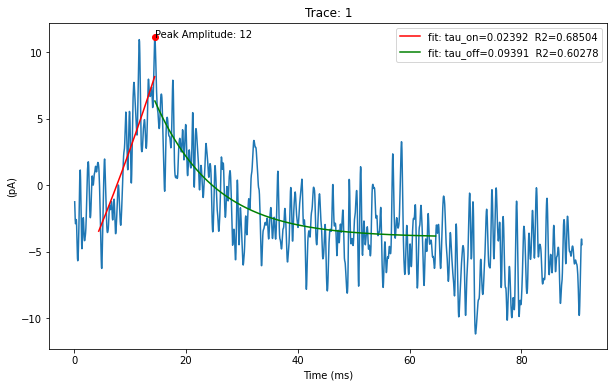

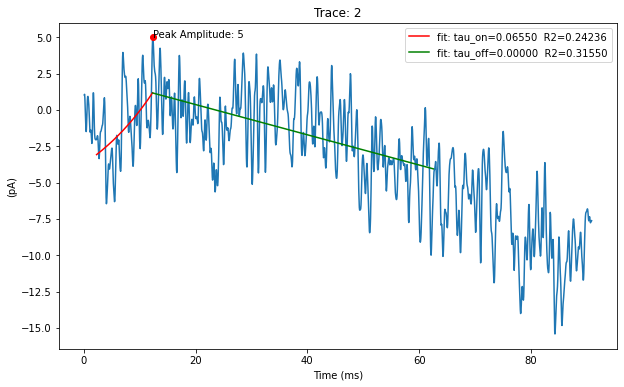

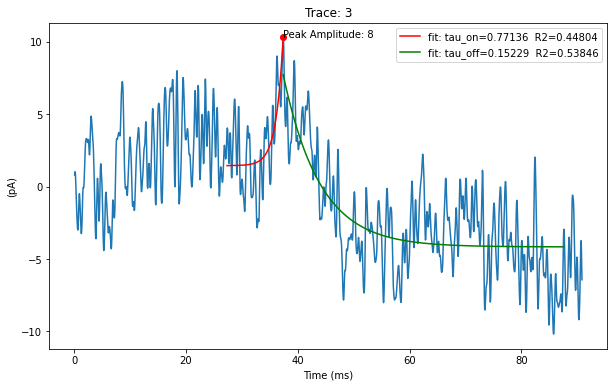

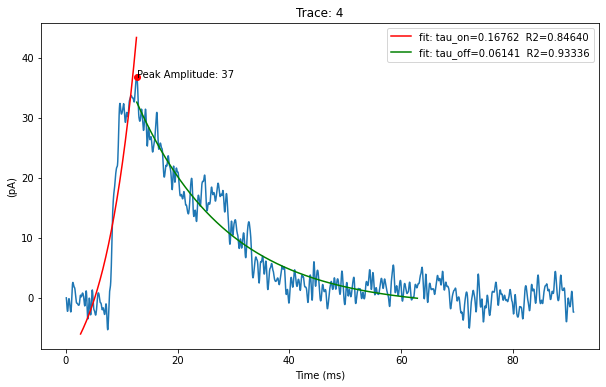

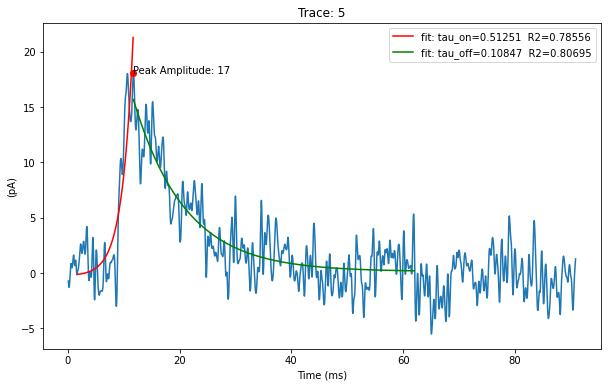

In [6]:
#%% Looking at some examples
time = data_before.iloc[:,0] * 1e3  # first column is time

# Dividing time into different windows (=part) in order to find the peaks
part = len(time)//9  #usually for 30ms 7 windows
#Define the path for the data 

Rsquares_ON = []  # list of on r2 square
Rsquares_OFF = []  # list of off r2 square
Rsquares_ON_selected = []  # list of on r2 square
Rsquares_OFF_selected = []  # list of off r2 square
taus_ON = []  # list of on fit parameters tau
taus_OFF = [] # list of off fit parameters tau
taus_ON_selected = [] # list of on fit parameters tau
taus_OFF_selected = [] # list of off fit parameters tau
amplitudes = []


for idx, column in enumerate(data_before.iloc[:,1:20]):                 # first column is time ######ADJUST THE SECOND COLUMN####

        trace =data_before[column]
        min_peak_value = np.max(trace[part:8*part]) # change according to your window size 2 less for 8 window size
        min_peak = np.where(trace==min_peak_value)[0][0]
        baseline= np.mean(trace[:min_peak-part])
        ###window sizes for analysis
        #window size for analysis: based on the traces we use an optimal window that 
        #captures the kinetics of the events usually 2ms for tau_ON and double sized window for tau_OFF
        tau_ON_win= min_peak-part
        tau_OFF_win= min_peak+5*part
        ON_time = time[tau_ON_win:min_peak]  # reversing time to fit the exponetial from bottom to up  
        ON_time = ON_time[::-1]                                             # shift the axes to fit the exponential from right to left
        ON_trace =trace[tau_ON_win:min_peak]
        OFF_time = time[min_peak:tau_OFF_win]
        OFF_trace = trace[min_peak:tau_OFF_win]
        
        
        # the initial parameters
        p0 = [np.abs(min_peak_value), np.abs(time[min_peak]), 0.00001]
        
        
        popt1_c, pcov1_c = curve_fit(func_exp_1, ON_time, ON_trace, p0,  maxfev = 100000) #
        yhat_on_c = func_exp_1(ON_time, *popt1_c)
        Rsquare_ON = r2_score(ON_trace, yhat_on_c)# R_square
        popt1 = popt1_c # putting all fit parametrs into one array
        popt1_tau =  1/popt1_c[1] # putting all taus into one array
        taus_ON.append(popt1_tau)
        Rsquares_ON.append(Rsquare_ON)
        
        fig1 = plt.figure(figsize=(10, 6))
        plt.plot(time, trace)
  
        plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))

        popt2_c, pcov2_c = curve_fit(func_exp_1, OFF_time, OFF_trace, p0, maxfev = 100000) #
        yhat2_c = func_exp_1(OFF_time, *popt2_c) 
        Rsquare_OFF = r2_score(OFF_trace, yhat2_c)
        popt2 = popt2_c # putting all fit parametrs into one array
        popt2_tau = 1/popt2_c[1] # putting all taus into one array
        taus_OFF.append(popt2_tau)
        Rsquares_OFF.append(Rsquare_OFF)
        plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
        amplitudes.append(min_peak_value-baseline)                 # find the peak of the amplitude

    
        plt.legend()
        plt.xlabel('Time (ms)')
        plt.ylabel('(pA)')
        plt.title('Trace: %d' %idx)
        plt.plot(time[min_peak],min_peak_value,'or', )
        plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )
        
        #plotting selected figures for ON
        if  popt1_tau < 10 and  popt1_tau > 0 and Rsquare_ON > 0.6 and min_peak_value-baseline < -10:
            fig2 = plt.figure(figsize=(10, 6))
            plt.plot(time, trace)
            plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            
            
            plt.legend()
            plt.xlabel('Time (ms)')
            plt.ylabel('(pA)')
            plt.title('Trace_ON_selected: %d' %idx)
            plt.plot(time[min_peak],min_peak_value,'or', )
            plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )


          #plotting selected figures for OFF  
        if  popt2_tau < 100 and  popt2_tau > 0 and Rsquare_OFF > 0.6 and min_peak_value-baseline < -10:
            fig3 = plt.figure(figsize=(10, 6))
            plt.plot(time, trace)
            plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            
            
            plt.legend()
            plt.xlabel('Time (ms)')
            plt.ylabel('(pA)')
            plt.title('Trace_OFF_selected: %d' %idx)
            plt.plot(time[min_peak],min_peak_value,'or', )
            plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )


    
    

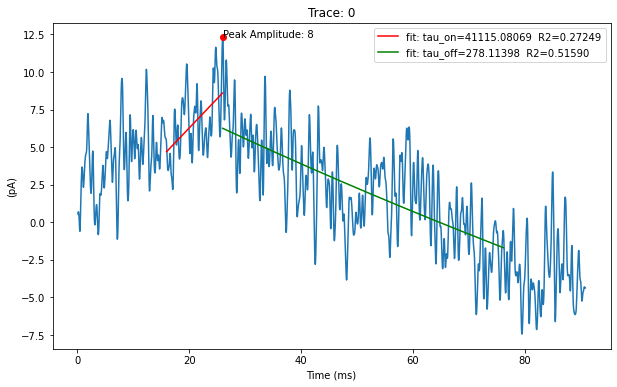

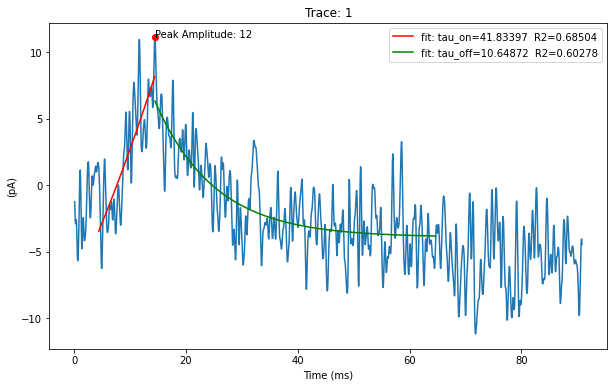

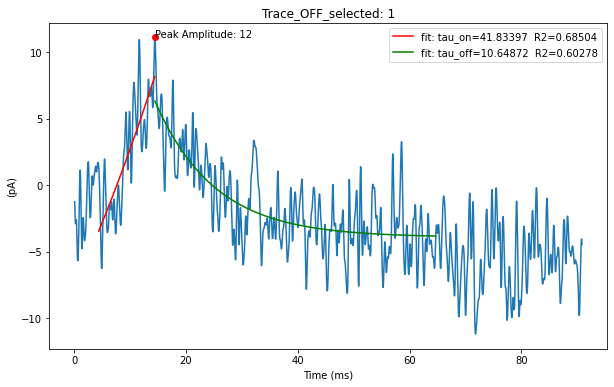

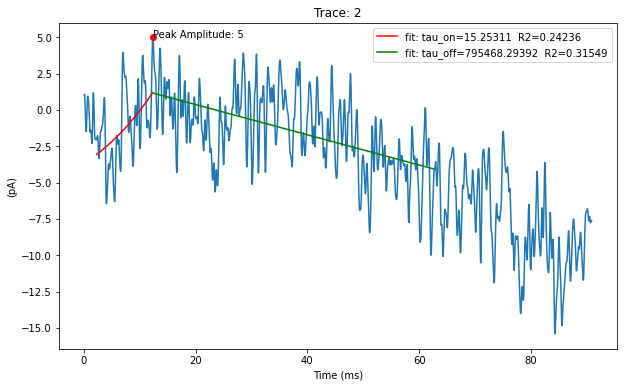

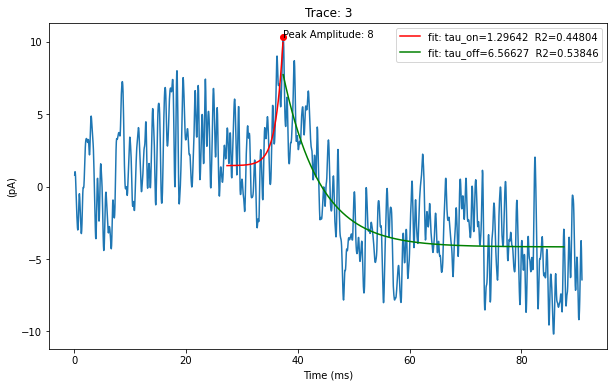

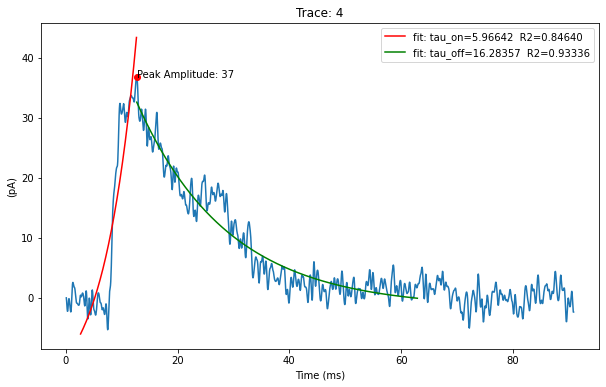

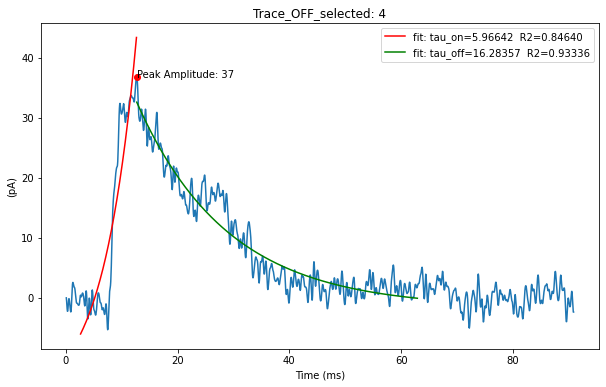

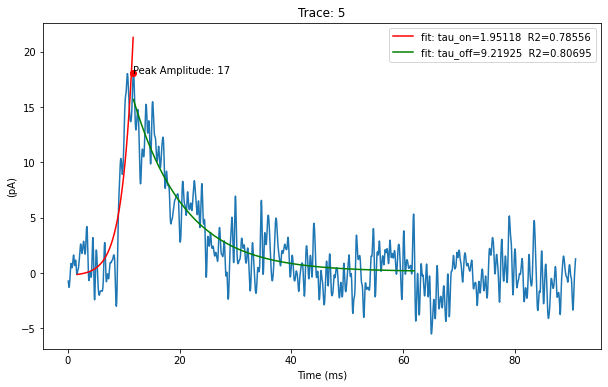

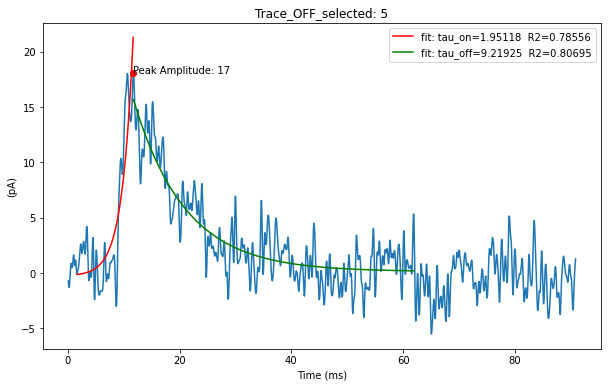

In [31]:
#%% Analyzing the entire data
# Time is in the first column of the data sheet
time = data_before.iloc[:,0] * 1e3

# Dividing time into different windows (=part) in order to find the peaks
part = len(time)//9  #usually for 30ms 7 windows
# The PDF document
pdf_pages_all = PdfPages(os.path.join(save_path ,'fit_results_before.pdf'))
pdf_pages_ON_selected = PdfPages(os.path.join(save_path ,'fit_results_ON_selected_before.pdf'))
pdf_pages_OFF_selected = PdfPages(os.path.join(save_path ,'fit_results_OFF_selected_before.pdf'))
# pdf_pages = PdfPages(path + 'fit_results.pdf')


Rsquares_ON = []  # list of on r2 square
Rsquares_OFF = []  # list of off r2 square
Rsquares_ON_selected = []  # list of on r2 square
Rsquares_OFF_selected = []  # list of off r2 square



taus_ON = []  # list of on fit parameters tau
taus_OFF = [] # list of off fit parameters tau
taus_ON_selected_before = [] # list of on fit parameters tau
taus_OFF_selected_before = [] # list of off fit parameters tau
amplitudes = []
amplitudes_selectedd_before = []
columnn =[]
trace_selected_before = []


for idx, column in enumerate(data_before.iloc[:,1:]):                 # first column is time


        trace =data_before[column]
        min_peak_value = np.max(trace[part:8*part])  # change according to your window size 2 less for 8 window size
        min_peak = np.where(trace==min_peak_value)[0][0]
        baseline= np.mean(trace[:min_peak-part])
        ###window sizes for analysis
        #window size for analysis: based on the traces we use an optimal window that 
        #captures the kinetics of the events usually 2ms for tau_ON and double sized window for tau_OFF
        tau_ON_win= min_peak-part
        tau_OFF_win= min_peak+5*part



        ON_time = time[tau_ON_win:min_peak]  # reversing time to fit the exponetial from bottom to up  
        ON_time = ON_time[::-1]                                             # shift the axes to fit the exponential from right to left
        ON_trace =trace[tau_ON_win:min_peak]
        OFF_time = time[min_peak:tau_OFF_win]
        OFF_trace = trace[min_peak:tau_OFF_win]
        
        # the initial parameters
        p0 = [np.abs(min_peak_value), np.abs(time[min_peak]), 0.001]
        popt1_c, pcov1_c = curve_fit(func_exp_1, ON_time, ON_trace, p0,  maxfev = 10000) #
        yhat_on_c = func_exp_1(ON_time, *popt1_c)
        Rsquare_ON = r2_score(ON_trace, yhat_on_c)# R_square
        popt1 = popt1_c # putting all fit parametrs into one array
        popt1_tau =  popt1_c[1] # putting all taus into one array NOTE: DIVIDE IF FIT IS MULTIPLICATION
        taus_ON.append(popt1_tau)
        Rsquares_ON.append(Rsquare_ON)
        # getting the ACCEPTED values for Excell File 
        if  popt1_tau < 10 and  popt1_tau > 0 and Rsquare_ON > 0.6 and min_peak_value-baseline >  10:
                taus_ON_selectedd = popt1_tau
                Rsquares_ON_selectedd = Rsquares_ON
                columnn.append(column)
                trace_selected_before.append(idx)
        else: 
                taus_ON_selectedd = 0
                Rsquares_ON_selectedd = 0
                
        # Getting the whole values for graphing
        if  popt1_tau < 10 and  popt1_tau > 0 and Rsquare_ON > 0.6 and min_peak_value-baseline >  10:
                taus_ON_selected_before.append(popt1_tau)
                Rsquares_ON_selected.append(Rsquare_ON)
        else: 
                taus_ON_selected_before.append(0)
                Rsquares_ON_selected.append(0)
        
        fig1 = plt.figure(figsize=(10, 6))
        plt.plot(time, trace)
        plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            

    

        # the initial parameters
        # p0_OFF = [np.min(OFF_trace), np.min(OFF_time), 0.1]
        
        popt2_c, pcov2_c = curve_fit(func_exp_1, OFF_time, OFF_trace, p0, maxfev = 10000) #
        yhat2_c = func_exp_1(OFF_time, *popt2_c) 
        Rsquare_OFF = r2_score(OFF_trace, yhat2_c)
  
        popt2 = popt2_c # putting all fit parametrs into one array
        popt2_tau = popt2_c[1] # putting all taus into one array
        

        taus_OFF.append(popt2_tau)
        Rsquares_OFF.append(Rsquare_OFF)
        
    # getting the values for Excell File we set the cut off for tau OFF < 5 ms
        if  popt2_tau < 100 and  popt2_tau > 0 and Rsquare_OFF > 0.6 and min_peak_value-baseline >  10:
                taus_OFF_selectedd = popt2_tau
                Rsquares_OFF_selectedd = Rsquares_OFF
        else: 
                taus_OFF_selectedd = 0
                Rsquares_OFF_selectedd = 0
        
        if  popt2_tau < 100 and  popt2_tau > 0 and Rsquare_OFF > 0.6 and min_peak_value-baseline >  10:
                taus_OFF_selected_before.append(popt2_tau)
                Rsquares_OFF_selected.append(Rsquare_OFF)
        else: 
                taus_OFF_selected_before.append(0)
                Rsquares_OFF_selected.append(0)
        

        plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            



        amplitudes.append(min_peak_value-baseline)                 # find the peak of the amplitude
        

        if min_peak_value-baseline >  10:                           # find the peak of the selcted amplitude
            amplitudes_selectedd_before.append(min_peak_value-baseline)
        else:
            amplitudes_selectedd_before.append(0)
            
        if min_peak_value-baseline >  10:                           # find the peak of the selcted amplitude
            amplitudes_selected = min_peak_value-baseline
        else:
            amplitudes_selected = 0

        plt.legend()
        plt.xlabel('Time (ms)')
        plt.ylabel('(pA)')
        plt.title('Trace: %d' %idx)
        plt.plot(time[min_peak],min_peak_value,'or', )
        plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )
    
        #FWHM
        # find the two crossing points
        # hmx = half_max_x(np.float64(time), np.float64(trace))
        # print the answer
        # fwhm = hmx[1] - hmx[0]
        # print("FWHM:{:.3f}".format(fwhm))
        # half = np.float64(((min_peak_value-baseline)/2.0) + baseline)
        # plt.plot(hmx, [half, half], '--k')
        # plt.annotate('FWHM: %.3f' %(fwhm), [hmx[1], half] )
        
        #plotting selected figures for ON
        if  popt1_tau < 10 and  popt1_tau > 0 and Rsquare_ON > 0.6 and min_peak_value-baseline < -10:
            fig2 = plt.figure(figsize=(10, 6))
            plt.plot(time, trace)
            plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            
            
            plt.legend()
            plt.xlabel('Time (ms)')
            plt.ylabel('(pA)')
            plt.title('Trace_ON_selected: %d' %idx)
            plt.plot(time[min_peak],min_peak_value,'or', )
            plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )
            pdf_pages_ON_selected.savefig(fig2)

            
            
          #plotting selected figures for OFF  
        if  popt2_tau < 100 and  popt2_tau > 0 and Rsquare_OFF > 0.6 and min_peak_value-baseline >  10:
            fig3 = plt.figure(figsize=(10, 6))
            plt.plot(time, trace)
            plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            
            
            plt.legend()
            plt.xlabel('Time (ms)')
            plt.ylabel('(pA)')
            plt.title('Trace_OFF_selected: %d' %idx)
            plt.plot(time[min_peak],min_peak_value,'or', )
            plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )
            pdf_pages_OFF_selected.savefig(fig3)
        
        pdf_pages_all.savefig(fig1)
        
        
pdf_pages_all.close()
pdf_pages_ON_selected.close()
pdf_pages_OFF_selected.close()


#Create workbook object
writer = pd.ExcelWriter(os.path.join(save_path, 'fit_results_initial_before.xlsx'))
pd.DataFrame({'taus_ON (ms)': 
      taus_ON}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=0, index=False)
pd.DataFrame({'Rsquares_ON': 
      Rsquares_ON}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=1, index=False)
pd.DataFrame({'taus_ON_selected (ms)': 
      taus_ON_selected_before}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=2, index=False)
pd.DataFrame({'taus_OFF (ms)': 
      taus_OFF}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=3, index=False)
pd.DataFrame({'Rsquares_OFF': 
      Rsquares_OFF}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=4, index=False)
pd.DataFrame({'taus_OFF_selected (ms)': 
      taus_OFF_selected_before}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=5, index=False)
pd.DataFrame({'amplitudes (pA)': 
      amplitudes}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=6, index=False)
pd.DataFrame({'amplitudes_selected (pA)': 
      amplitudes_selectedd_before}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=7, index=False)

median_ON= np.median([x for x in taus_ON_selected_before if x !=0])
median_OFF= np.median([x for x in taus_OFF_selected_before if x !=0])
median_amplitudes = np.median([x for x in amplitudes_selectedd_before if x !=0])
IPSC_freq = np.size([x for x in taus_ON_selected_before if x !=0])/Win_duration
pd.DataFrame({'IPSC_freqency (Hz)': 
      [IPSC_freq]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=3, index=False)
pd.DataFrame({'taus_ON_selected (ms)': 
      [median_ON]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=0, index=False)
pd.DataFrame({'taus_OFF_selected (ms)': 
      [median_OFF]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=1, index=False)
pd.DataFrame({'amplitudes_selected (pA)': 
      [median_amplitudes]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=2, index=False)



writer.save()


In [16]:

trace_avr = []
for idx, aa in enumerate(columnn):
    trace = data_before[aa]
    trace_avr.append(trace)
trace_avr1 = np.average(trace_avr, axis =0)
b = go.Scatter(x=time.values.tolist(), y=trace_avr1.tolist(),mode='markers+lines',
    name='Average',
    marker=dict(
        color='rgb(255,0,0)',
        symbol='0'))
x=time.values.tolist()
y=trace_avr1.tolist()
fig1 = px.line(x=x, y=y, labels={'x':'time (ms)', 'y':'pA'})


dataa=[b, ]
for idx, aa in enumerate(columnn):
    trace = data_before[aa]
    a = go.Scatter(x=time.values.tolist(), y=trace.values.tolist(), mode='lines',
    name='trace(%d)' %idx,
    marker=dict(
        color='rgb(100, 100, 100)'))
    dataa.append(a)
pyo.init_notebook_mode()
pyo.iplot(dataa)

fig1.add_annotation(text="IPSC_frequency = %.3f" %IPSC_freq,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig1.show()
fig1.write_image(os.path.join(save_path , 'mean_sIPSC_before.svg'))
fig1.write_image(os.path.join(save_path , 'mean_sIPSC_before.pdf'))

In [17]:
#%% plotting Tau_ON against R2 without outliers (<1)
median_ON= np.median([x for x in taus_ON_selected_before if x !=0])
x = [x for x in taus_ON_selected_before if x !=0]
y = [x for x in Rsquares_ON_selected if x !=0]
fig = px.scatter(x = x, y= y, labels={'x':'Tau on (ms)', 'y':'R2_Square'},title="Tau_ON before")
fig.add_annotation(text="Median = %.3f" %median_ON,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig.show()
fig.write_image(os.path.join(save_path , 'Tau_ON_before.svg'))
fig.write_image(os.path.join(save_path , 'Tau_ON_before.pdf'))



In [18]:
#%% plotting Tau_OFF against R2 without outliers (<1)
median_OFF= np.median([x for x in taus_OFF_selected_before if x !=0])
x = [x for x in taus_OFF_selected_before if x !=0]
y = [x for x in Rsquares_OFF_selected if x !=0]
fig = px.scatter(x = x, y= y, labels={'x':'Tau OFF (ms)', 'y':'R2_Square'},title="Tau_OFF before")
fig.add_annotation(text="Median = %.3f" %median_OFF,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig.show()
fig.write_image(os.path.join(save_path , 'Tau_OFF_before.svg'))
fig.write_image(os.path.join(save_path , 'Tau_OFF_before.pdf'))

In [19]:
#%% plotting amplitudes_selectedd  without outliers (<1)
final_amplitudes = [x for x in amplitudes_selectedd_before if x !=0]
median_amplitude= np.median([x for x in amplitudes_selectedd_before if x !=0])




x = [x for x in final_amplitudes if x !=0]
fig = px.histogram(x = x,  labels={'x':'Amplitude (pA)'},title="amplitudes before")
fig.add_annotation(text="Median = %.2f" %median_amplitude,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig.show()
fig.write_image(os.path.join(save_path , 'amplitudes_before.svg'))
fig.write_image(os.path.join(save_path , 'amplitudes_before.pdf'))





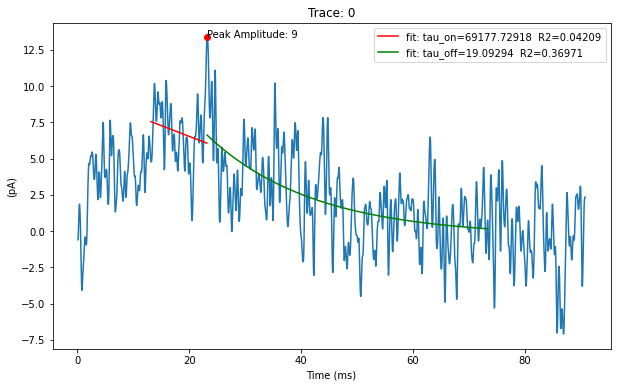

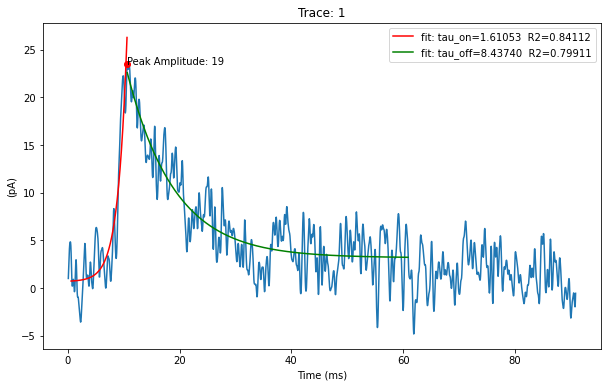

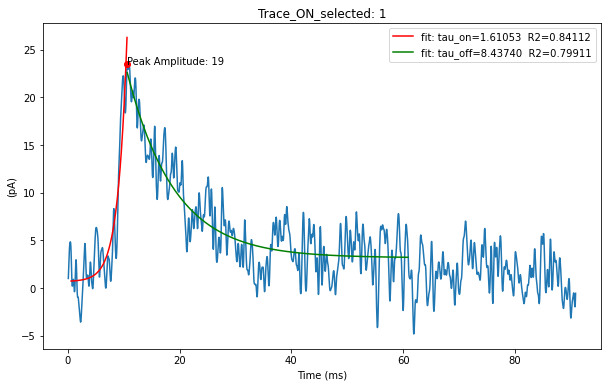

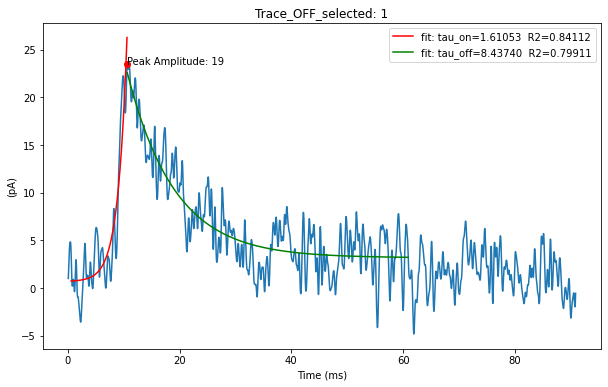

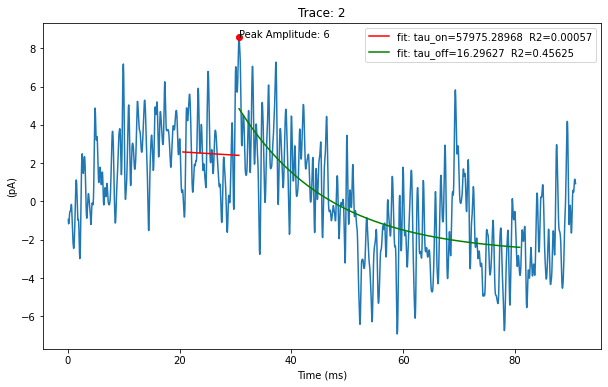

...

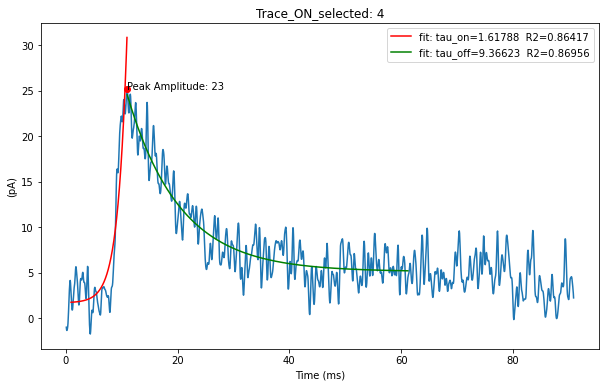

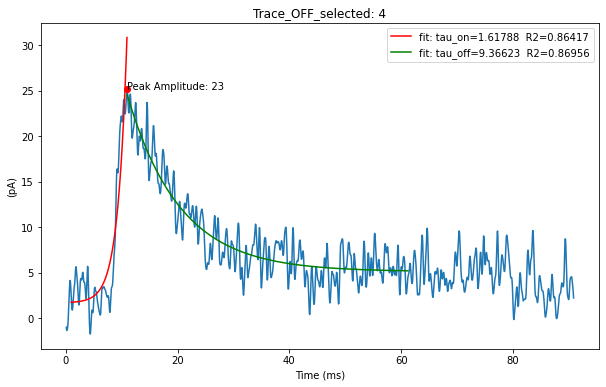

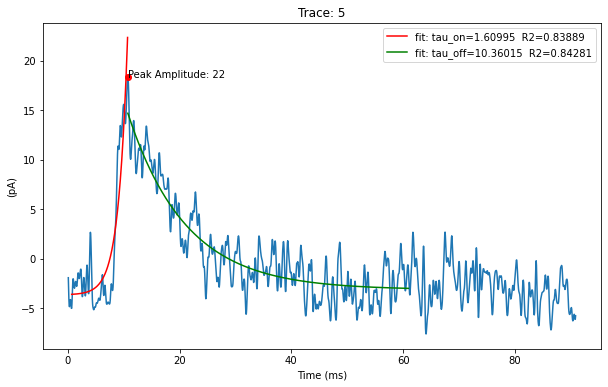

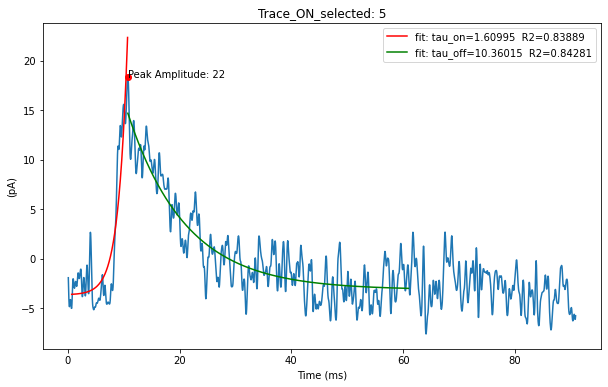

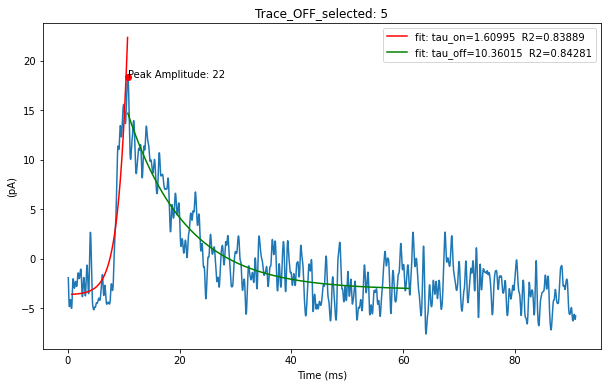

In [23]:
#%% Time is in the first column of the data sheet
time = data_after.iloc[:,0] * 1e3

# Dividing time into different windows (=part) in order to find the peaks
part = len(time)//9  #usually for 30ms 7 windows


# The PDF document
pdf_pages_all = PdfPages(os.path.join(save_path ,'fit_results_after.pdf'))
pdf_pages_ON_selected = PdfPages(os.path.join(save_path ,'fit_results_ON_selected_after.pdf'))
pdf_pages_OFF_selected = PdfPages(os.path.join(save_path ,'fit_results_OFF_selected_after.pdf'))
# pdf_pages = PdfPages(path + 'fit_results.pdf')


Rsquares_ON = []  # list of on r2 square
Rsquares_OFF = []  # list of off r2 square
Rsquares_ON_selected = []  # list of on r2 square
Rsquares_OFF_selected = []  # list of off r2 square



taus_ON = []  # list of on fit parameters tau
taus_OFF = [] # list of off fit parameters tau
taus_ON_selected_after = [] # list of on fit parameters tau
taus_OFF_selected_after = [] # list of off fit parameters tau
amplitudes = []
amplitudes_selectedd_after = []
columnn =[]
trace_selected_after = []


for idx, column in enumerate(data_after.iloc[:,1:]):                 # first column is time


        trace =data_after[column]
        min_peak_value = np.max(trace[part:8*part])  # change according to your window size 2 less for 8 window size
        min_peak = np.where(trace==min_peak_value)[0][0]
        baseline= np.mean(trace[:min_peak-part])
        ###window sizes for analysis
        #window size for analysis: based on the traces we use an optimal window that 
        #captures the kinetics of the events usually 2ms for tau_ON and double sized window for tau_OFF
        tau_ON_win= min_peak-part
        tau_OFF_win= min_peak+5*part



        ON_time = time[tau_ON_win:min_peak]  # reversing time to fit the exponetial from bottom to up  
        ON_time = ON_time[::-1]                                             # shift the axes to fit the exponential from right to left
        ON_trace =trace[tau_ON_win:min_peak]
        OFF_time = time[min_peak:tau_OFF_win]
        OFF_trace = trace[min_peak:tau_OFF_win]
        
        # the initial parameters
        p0 = [np.abs(min_peak_value), np.abs(time[min_peak]), 0.001]
        popt1_c, pcov1_c = curve_fit(func_exp_1, ON_time, ON_trace, p0,  maxfev = 10000) #
        yhat_on_c = func_exp_1(ON_time, *popt1_c)
        Rsquare_ON = r2_score(ON_trace, yhat_on_c)# R_square
        popt1 = popt1_c # putting all fit parametrs into one array
        popt1_tau =  popt1_c[1] # putting all taus into one array NOTE: DIVIDE IF FIT IS MULTIPLICATION
        taus_ON.append(popt1_tau)
        Rsquares_ON.append(Rsquare_ON)
        # getting the ACCEPTED values for Excell File 
        if  popt1_tau < 10 and  popt1_tau > 0 and Rsquare_ON > 0.6 and min_peak_value-baseline > 10:
                taus_ON_selectedd = popt1_tau
                Rsquares_ON_selectedd = Rsquares_ON
                columnn.append(column)
                trace_selected_after.append(idx)
        else: 
                taus_ON_selectedd = 0
                Rsquares_ON_selectedd = 0
                
        # Getting the whole values for graphing
        if  popt1_tau < 10 and  popt1_tau > 0 and Rsquare_ON > 0.6 and min_peak_value-baseline > 10:
                taus_ON_selected_after.append(popt1_tau)
                Rsquares_ON_selected.append(Rsquare_ON)
        else: 
                taus_ON_selected_after.append(0)
                Rsquares_ON_selected.append(0)
        
        fig1 = plt.figure(figsize=(10, 6))
        plt.plot(time, trace)
        plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            

    

        # the initial parameters
        # p0_OFF = [np.min(OFF_trace), np.min(OFF_time), 0.1]
        
        popt2_c, pcov2_c = curve_fit(func_exp_1, OFF_time, OFF_trace, p0, maxfev = 10000) #
        yhat2_c = func_exp_1(OFF_time, *popt2_c) 
        Rsquare_OFF = r2_score(OFF_trace, yhat2_c)
  
        popt2 = popt2_c # putting all fit parametrs into one array
        popt2_tau = popt2_c[1] # putting all taus into one array
        

        taus_OFF.append(popt2_tau)
        Rsquares_OFF.append(Rsquare_OFF)
        
    # getting the values for Excell File we set the cut off for tau OFF < 5 ms
        if  popt2_tau < 100 and  popt2_tau > 0 and Rsquare_OFF > 0.6 and min_peak_value-baseline > 10:
                taus_OFF_selectedd = popt2_tau
                Rsquares_OFF_selectedd = Rsquares_OFF
        else: 
                taus_OFF_selectedd = 0
                Rsquares_OFF_selectedd = 0
        
        if  popt2_tau < 100 and  popt2_tau > 0 and Rsquare_OFF > 0.6 and min_peak_value-baseline > 10:
                taus_OFF_selected_after.append(popt2_tau)
                Rsquares_OFF_selected.append(Rsquare_OFF)
        else: 
                taus_OFF_selected_after.append(0)
                Rsquares_OFF_selected.append(0)
        

        plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            



        amplitudes.append(min_peak_value-baseline)                 # find the peak of the amplitude
        

        if min_peak_value-baseline > 10:                           # find the peak of the selcted amplitude
            amplitudes_selectedd_after.append(min_peak_value-baseline)
        else:
            amplitudes_selectedd_after.append(0)
            
        if min_peak_value-baseline > 10:                           # find the peak of the selcted amplitude
            amplitudes_selected = min_peak_value-baseline
        else:
            amplitudes_selected = 0

        plt.legend()
        plt.xlabel('Time (ms)')
        plt.ylabel('(pA)')
        plt.title('Trace: %d' %idx)
        plt.plot(time[min_peak],min_peak_value,'or', )
        plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )
    
        #FWHM
        # find the two crossing points
        # hmx = half_max_x(np.float64(time), np.float64(trace))
        # print the answer
        # fwhm = hmx[1] - hmx[0]
        # print("FWHM:{:.3f}".format(fwhm))
        # half = np.float64(((min_peak_value-baseline)/2.0) + baseline)
        # plt.plot(hmx, [half, half], '--k')
        # plt.annotate('FWHM: %.3f' %(fwhm), [hmx[1], half] )
        
        #plotting selected figures for ON
        if  popt1_tau < 10 and  popt1_tau > 0 and Rsquare_ON > 0.6 and min_peak_value-baseline > 10:
            fig2 = plt.figure(figsize=(10, 6))
            plt.plot(time, trace)
            plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            
            
            plt.legend()
            plt.xlabel('Time (ms)')
            plt.ylabel('(pA)')
            plt.title('Trace_ON_selected: %d' %idx)
            plt.plot(time[min_peak],min_peak_value,'or', )
            plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )
            pdf_pages_ON_selected.savefig(fig2)

            
            
          #plotting selected figures for OFF  
        if  popt2_tau < 100 and  popt2_tau > 0 and Rsquare_OFF > 0.6 and min_peak_value-baseline > 10:
            fig3 = plt.figure(figsize=(10, 6))
            plt.plot(time, trace)
            plt.plot(time[tau_ON_win:min_peak], func_exp_1(ON_time, *popt1), 'r-', label='fit: tau_on=%5.5f  R2=%5.5f' % (popt1_tau, Rsquare_ON))
            plt.plot(time[min_peak:tau_OFF_win], func_exp_1(OFF_time, *popt2), 'g-', label='fit: tau_off=%5.5f  R2=%5.5f' % (popt2_tau, Rsquare_OFF))
            
            
            plt.legend()
            plt.xlabel('Time (ms)')
            plt.ylabel('(pA)')
            plt.title('Trace_OFF_selected: %d' %idx)
            plt.plot(time[min_peak],min_peak_value,'or', )
            plt.annotate('Peak Amplitude: %d' %(min_peak_value-baseline), [time[min_peak],min_peak_value] )
            pdf_pages_OFF_selected.savefig(fig3)
        
        pdf_pages_all.savefig(fig1)
        

pdf_pages_all.close()
pdf_pages_ON_selected.close()
pdf_pages_OFF_selected.close()

#Create workbook object
writer = pd.ExcelWriter(os.path.join(save_path, 'fit_results_initial_after.xlsx'))
pd.DataFrame({'taus_ON (ms)': 
      taus_ON}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=0, index=False)
pd.DataFrame({'Rsquares_ON': 
      Rsquares_ON}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=1, index=False)
pd.DataFrame({'taus_ON_selected (ms)': 
      taus_ON_selected_after}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=2, index=False)
pd.DataFrame({'taus_OFF (ms)': 
      taus_OFF}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=3, index=False)
pd.DataFrame({'Rsquares_OFF': 
      Rsquares_OFF}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=4, index=False)
pd.DataFrame({'taus_OFF_selected (ms)': 
      taus_OFF_selected_after}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=5, index=False)
pd.DataFrame({'amplitudes (pA)': 
      amplitudes}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=6, index=False)
pd.DataFrame({'amplitudes_selected (pA)': 
      amplitudes_selectedd_after}).to_excel(writer,sheet_name = 
                                       'sIPSCs results', startcol=7, index=False)

median_ON= np.median([x for x in taus_ON_selected_after if x !=0])
median_OFF= np.median([x for x in taus_OFF_selected_after if x !=0])
median_amplitudes = np.median([x for x in amplitudes_selectedd_after if x !=0])
IPSC_freq = np.size([x for x in taus_ON_selected_after if x !=0])/Win_duration
pd.DataFrame({'IPSC_freqency (Hz)': 
      [IPSC_freq]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=3, index=False)
pd.DataFrame({'taus_ON_selected (ms)': 
      [median_ON]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=0, index=False)
pd.DataFrame({'taus_OFF_selected (ms)': 
      [median_OFF]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=1, index=False)
pd.DataFrame({'amplitudes_selected (pA)': 
      [median_amplitudes]}).to_excel(writer,sheet_name = 
                                       'sIPSCs results median', startcol=2, index=False)


writer.save()


In [25]:

trace_avr = []
for idx, aa in enumerate(columnn):
    trace = data_after[aa]
    trace_avr.append(trace)
trace_avr1 = np.average(trace_avr, axis =0)
b = go.Scatter(x=time.values.tolist(), y=trace_avr1.tolist(),mode='markers+lines',
    name='Average',
    marker=dict(
        color='rgb(255,0,0)',
        symbol='0'))
x=time.values.tolist()
y=trace_avr1.tolist()
fig2 = px.line(x=x, y=y, labels={'x':'time (ms)', 'y':'pA'})


dataa=[b, ]
for idx, aa in enumerate(columnn):
    trace = data_after[aa]
    a = go.Scatter(x=time.values.tolist(), y=trace.values.tolist(), mode='lines',
    name='trace(%d)' %idx,
    marker=dict(
        color='rgb(100, 100, 100)'))
    dataa.append(a)
pyo.init_notebook_mode()
pyo.iplot(dataa)
fig2.add_annotation(text="IPSC_frequency = %.3f" %IPSC_freq,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig2.show()
fig2.write_image(os.path.join(save_path , 'mean_sIPSC_after.svg'))
fig2.write_image(os.path.join(save_path , 'mean_sIPSC_after.pdf'))

In [26]:
#%% plotting Tau_ON against R2 without outliers (<1)
median_ON= np.median([x for x in taus_ON_selected_after if x !=0])
x = [x for x in taus_ON_selected_after if x !=0]
y = [x for x in Rsquares_ON_selected if x !=0]
fig = px.scatter(x = x, y= y, labels={'x':'Tau on (ms)', 'y':'R2_Square'},title="Tau_ON after")
fig.add_annotation(text="Median = %.3f" %median_ON,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig.show()
fig.write_image(os.path.join(save_path , 'Tau_ON_after.svg'))
fig.write_image(os.path.join(save_path , 'Tau_ON_after.pdf'))



In [27]:
#%% plotting Tau_OFF against R2 without outliers (<1)
median_OFF= np.median([x for x in taus_OFF_selected_after if x !=0])
x = [x for x in taus_OFF_selected_after if x !=0]
y = [x for x in Rsquares_OFF_selected if x !=0]
fig = px.scatter(x = x, y= y, labels={'x':'Tau OFF (ms)', 'y':'R2_Square'},title="Tau_OFF after")
fig.add_annotation(text="Median = %.3f" %median_OFF,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig.show()
fig.write_image(os.path.join(save_path , 'Tau_OFF_after.svg'))
fig.write_image(os.path.join(save_path , 'Tau_OFF_after.pdf'))

In [28]:
#%% plotting amplitudes_selectedd  without outliers (<1)
final_amplitudes = [x for x in amplitudes_selectedd_after if x !=0]
median_amplitude= np.median([x for x in amplitudes_selectedd_after if x !=0])




x = [x for x in final_amplitudes if x !=0]
fig = px.histogram(x = x,  labels={'x':'Amplitude (pA)'},title="amplitudes after")
fig.add_annotation(text="Median = %.2f" %median_amplitude,
                  xref="paper", yref="paper",
                  x=0.9, y=0.9, showarrow=False)
fig.show()
fig.write_image(os.path.join(save_path , 'amplitudes_after.svg'))
fig.write_image(os.path.join(save_path , 'amplitudes_after.pdf'))





In [34]:
time_before = list(range(2, 17)) # the duration of window to be analyzed [1000:16000] in ms
# print(time_before)
time_after = list(range(16, 31)) # the duration of window to be analyzed [16000:31000] in ms
# print(time_after)

In [47]:
#Firing frequency rate before and after the PPR
freq_rates_before = []
for ii in range(1,16): # the duration of window to be analyzed [2000:16000] in ms
    freq_rate = len([x for x in Event_time_before.iloc[trace_selected_before,:].values if ii*1e3 <= x <= (ii+1)*1e3]) 
    freq_rates_before.append(freq_rate)
    
print(freq_rates_before)

freq_rates_after = []
for ii in range(16,31): # the duration of window to be analyzed [16100:30100] in ms
    freq_rate = len([x for x in Event_time_after.iloc[trace_selected_after,:].values if ii*1e3 <= x <= (ii+1)*1e3]) 
    freq_rates_after.append(freq_rate)
    
print(freq_rates_after)


fig1 = px.scatter(x=time_before, y=freq_rates_before, labels={'x':'time (s)', 'y':'$IPSC(s^-1)$'}, title="Before PPR", 
           color_discrete_sequence=px.colors.qualitative.Light24)
fig1.update_yaxes(range=[0, 3])
fig1.show()

fig2 = px.scatter(x=time_after, y=freq_rates_after, labels={'x':'time (s)', 'y':'$IPSC(s^-1)$'}, title="After PPR", 
           color_discrete_sequence=px.colors.qualitative.Plotly)
fig2.update_yaxes(range=[0, 3])
fig2.show()
fig1.write_image(os.path.join(save_path , 'IPSC_freq_before.svg'))
fig1.write_image(os.path.join(save_path , 'IPSC_freq_before.pdf'))
fig2.write_image(os.path.join(save_path , 'IPSC_freq_after.svg'))
fig2.write_image(os.path.join(save_path , 'IPSC_freq_after.pdf'))

[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 1, 0, 0, 0, 0]


In [39]:
trace_selected_after

[1, 3, 4, 5]

In [42]:
#Amplitude rate before and after the PPR
# the list of time of indices of selected events for each window
gg_before =[]
for ii in range(1,16):
    gg_before.append([u for u in Event_time_before.iloc[trace_selected_before].values.flatten() if ii*1e3 <= u <= (ii+1)*1e3])
# print(gg_before)


# the list of indices of selected amplitudes for each window
final_before = []
for ii in range(np.size(gg_before)):
    if gg_before[ii] == []:
           final_before.append([0])
    else:
        l = [0] * np.size(gg_before[ii])
        for y,x in enumerate(gg_before[ii]):
            
#            final_before.append([x for x in Event_time[Event_time['Event_time']== x].index.values][0])
            l.insert(y, [x for x in Event_time_before[Event_time_before['Event_time']== x].index.values][0])
        l = [i for i in l if i != 0]
        final_before.append(l)        
# print(final_before)


# the list of averaged selected amplitudes for each window
amp_before = []
for i in range(np.size(final_before)):
    ff=np.median(np.array(amplitudes_selectedd_before)[final_before[i]])
    amp_before.append(ff)
# print(amp_before)


gg_after =[]
for ii in range(16,31):
    gg_after.append([u for u in Event_time_after.iloc[trace_selected_after].values.flatten() if ii*1e3 <= u <= (ii+1)*1e3])
# print(gg_after)


# the list of indices of selected amplitudes for each window
final_after = []
# gg_before = [u for u in Event_time.iloc[trace_selected_before,:].values.flatten() if 3*1e3 <= u <= (5+1)*1e3]
for ii in range(np.size(gg_after)):
    if gg_after[ii] == []:
           final_after.append([0])
    else:
        l = [0] * np.size(gg_after[ii])
        for y,x in enumerate(gg_after[ii]):
            
#            final_before.append([x for x in Event_time[Event_time['Event_time']== x].index.values][0])
            l.insert(y, [x for x in Event_time_after[Event_time_after['Event_time']== x].index.values][0])
        l = [i for i in l if i != 0]
        final_after.append(l)        
# print(final_after)


# the list of averaged selected amplitudes for each window
amp_after = []
for i in range(np.size(final_after)):
    ff=np.median(np.array(amplitudes_selectedd_after)[final_after[i]])
    amp_after.append(ff)
# print(amp_after)




In [48]:
fig1 = px.scatter(x=time_before, y=amp_before, labels={'x':'time (s)', 'y':'Amplitude (pA)'}, title="Before PPR", 
           color_discrete_sequence=px.colors.qualitative.Light24)
fig1.update_yaxes(range=[0, 40])
fig1.show()

fig2 = px.scatter(x=time_after, y=amp_after, labels={'x':'time (s)', 'y':'Amplitude (pA)'}, title="After PPR", 
           color_discrete_sequence=px.colors.qualitative.Plotly)
fig2.update_yaxes(range=[0, 40])
fig2.show()
fig1.write_image(os.path.join(save_path , 'IPSC_amp_before.svg'))
fig1.write_image(os.path.join(save_path , 'IPSC_amp_before.pdf'))
fig2.write_image(os.path.join(save_path , 'IPSC_amp_after.svg'))
fig2.write_image(os.path.join(save_path , 'IPSC_amp_after.pdf'))

In [45]:
#Tau ON rate before and after the PPR
# the list of time of indices of selected events for each window


# the list of averaged selected amplitudes for each window
tauON_before = []
for i in range(np.size(final_before)):
    ff=np.median(np.array(taus_ON_selected_before)[final_before[i]])
    tauON_before.append(ff)
# print(tauON_before)


# the list of averaged selected amplitudes for each window
tauON_after = []
for i in range(np.size(final_after)):
    ff=np.median(np.array(taus_ON_selected_after)[final_after[i]])
    tauON_after.append(ff)
# print(tauON_after)




In [49]:
fig1 = px.scatter(x=time_before, y=tauON_before, labels={'x':'time (s)', 'y':'tau (ms)'}, title="Before PPR", 
           color_discrete_sequence=px.colors.qualitative.Light24)
fig1.update_yaxes(range=[0, 4])
fig1.show()

fig2 = px.scatter(x=time_after, y=tauON_after, labels={'x':'time (s)', 'y':'tau (ms)'}, title="After PPR", 
           color_discrete_sequence=px.colors.qualitative.Plotly)
fig2.update_yaxes(range=[0, 4])
fig2.show()
fig1.write_image(os.path.join(save_path , 'IPSC_tauON_before.svg'))
fig1.write_image(os.path.join(save_path , 'IPSC_tauON_before.pdf'))
fig2.write_image(os.path.join(save_path , 'IPSC_tauON_after.svg'))
fig2.write_image(os.path.join(save_path , 'IPSC_tauON_after.pdf'))

In [50]:
#Tau OFF rate before and after the PPR
# the list of time of indices of selected events for each window


# the list of averaged selected amplitudes for each window
tauOFF_before = []
for i in range(np.size(final_before)):
    ff=np.median(np.array(taus_OFF_selected_before)[final_before[i]])
    tauOFF_before.append(ff)
# print(tauOFF_before)


# the list of averaged selected amplitudes for each window
tauOFF_after = []
for i in range(np.size(final_after)):
    ff=np.median(np.array(taus_OFF_selected_after)[final_after[i]])
    tauOFF_after.append(ff)
# print(tauOFF_after)


In [52]:
fig1 = px.scatter(x=time_before, y=tauOFF_before, labels={'x':'time (s)', 'y':'tau (ms)'}, title="Before PPR", 
           color_discrete_sequence=px.colors.qualitative.Light24)
fig1.update_yaxes(range=[0, 20])
fig1.show()

fig2 = px.scatter(x=time_after, y=tauOFF_after, labels={'x':'time (s)', 'y':'tau (ms)'}, title="After PPR", 
           color_discrete_sequence=px.colors.qualitative.Plotly)
fig2.update_yaxes(range=[0, 20])
fig2.show()
fig1.write_image(os.path.join(save_path , 'IPSC_tauOFF_before.svg'))
fig1.write_image(os.path.join(save_path , 'IPSC_tauOFF_before.pdf'))
fig2.write_image(os.path.join(save_path , 'IPSC_tauOFF_after.svg'))
fig2.write_image(os.path.join(save_path , 'IPSC_tauOFF_after.pdf'))

In [54]:
#Create workbook object
writer = pd.ExcelWriter(os.path.join(save_path, 'fit_results_dynamics.xlsx'))
pd.DataFrame({'freq_rates_before (Hz)': 
      freq_rates_before}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=0, index=False)
pd.DataFrame({'freq_rates_after (Hz)': 
      freq_rates_after}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=1, index=False)
pd.DataFrame({'amp_before (pA)': 
      amp_before}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=2, index=False)
pd.DataFrame({'amp_after (pA)': 
      amp_after}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=3, index=False)
pd.DataFrame({'tauON_before (ms)': 
      tauON_before}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=4, index=False)
pd.DataFrame({'tauON_after (ms)': 
      tauON_after}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=5, index=False)
pd.DataFrame({'tauOFF_before (ms)': 
      tauOFF_before}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=6, index=False)
pd.DataFrame({'tauOFF_after (ms)': 
      tauOFF_after}).to_excel(writer,sheet_name = 
                                       'sIPSCs dynamics', startcol=7, index=False)


writer.save()